Importing the libraries

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import imageio
from scipy import misc

Importing the image

In [2]:
imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")

C:\Users\Hello\AppData\Local\Temp\ipykernel_3284\2036576660.py:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")


More about the image

In [3]:
type(imageone)

numpy.ndarray

Printing the image

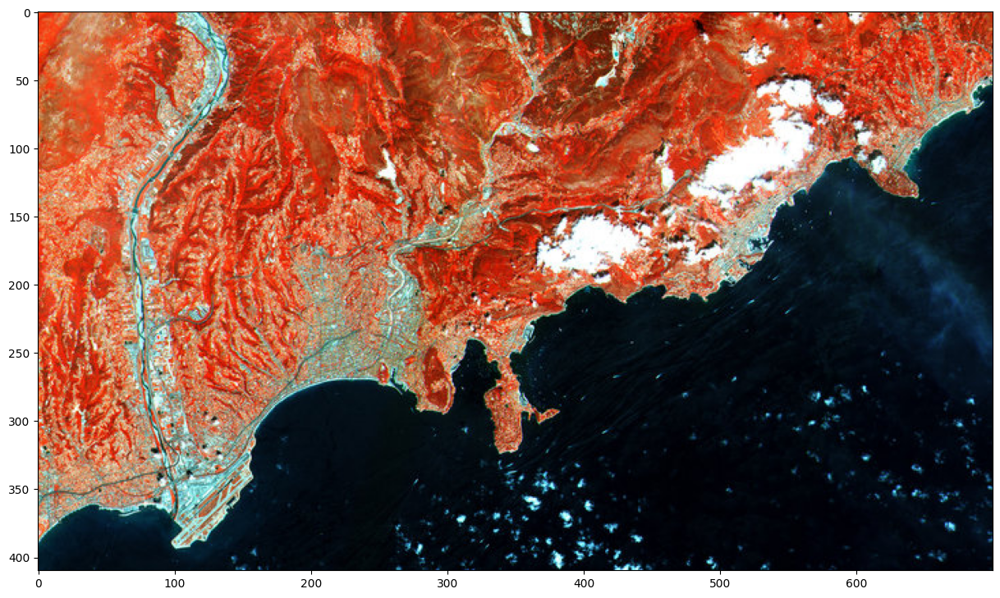

In [4]:
plt.figure(figsize=(15,15))
plt.imshow(imageone)
plt.show()

Image description

In [5]:
imageone.shape

(410, 700, 3)

In [7]:
# print(imageone)

[[[241  73  26]
  [239  83  32]
  [232  96  38]
  ...
  [181  46  14]
  [186  59  27]
  [194  84  51]]

 [[253  72  25]
  [255  77  29]
  [255  78  30]
  ...
  [183  53  17]
  [184  55  23]
  [189  66  33]]

 [[233  68  10]
  [240  65  12]
  [246  58  12]
  ...
  [183  60  18]
  [186  52  15]
  [188  49  16]]

 ...

 [[  3  26  40]
  [  4  27  41]
  [  5  28  42]
  ...
  [  4   4  14]
  [  0   4  15]
  [  0   6  16]]

 [[  3  29  44]
  [  4  27  43]
  [  5  28  46]
  ...
  [  0   8  20]
  [  8  25  35]
  [  0  16  26]]

 [[  3  29  44]
  [  4  27  43]
  [  5  28  46]
  ...
  [  0   9  21]
  [  9  26  36]
  [  0  16  26]]]


In [8]:
imageone.size

861000

In [10]:
print(imageone.min(),imageone.max())

0 255


In [11]:
imageone.mean()

80.6022218350755

finding a pixel on a given row and column

In [12]:
imageone[150, 250]

array([159, 135,  99], dtype=uint8)

finding value of a specific column

In [16]:
imageone[150, 250, 2]

99

setting all pixels to zero

In [17]:
imageone[150, 250] = 0

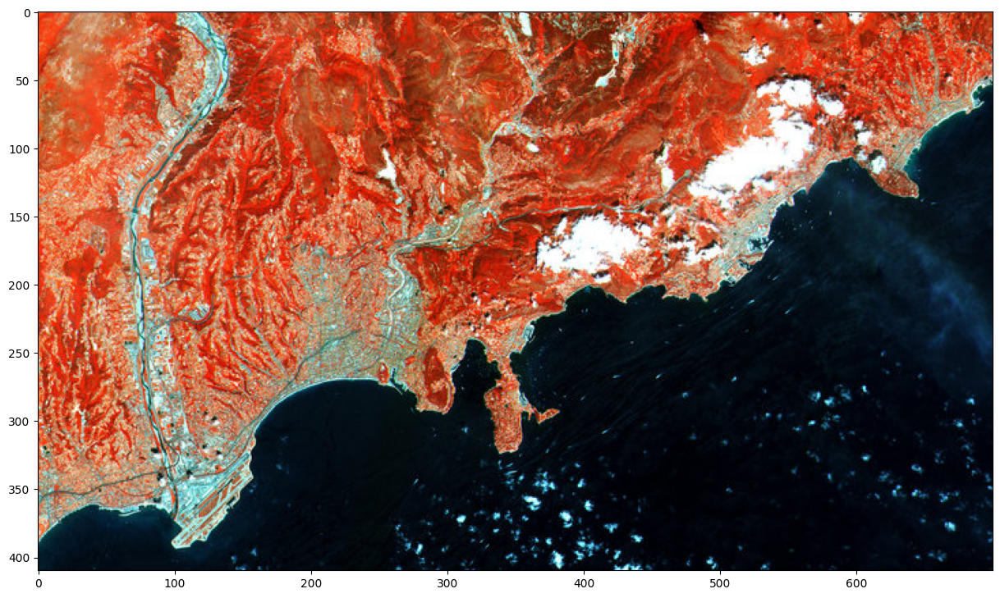

In [18]:
plt.figure(figsize=(15,15))
plt.imshow(imageone)
plt.show()

Changing color in range giving it full intensity

C:\Users\Hello\AppData\Local\Temp\ipykernel_3284\3388305425.py:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")


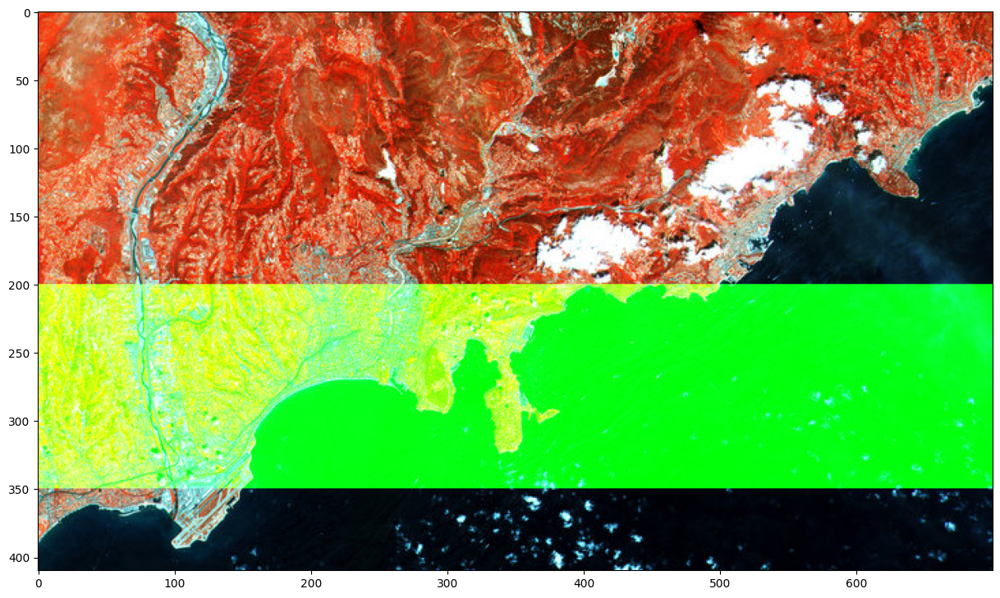

In [29]:
imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")
imageone[200:350, : ,1] = 255
plt.figure(figsize=(15,15))
plt.imshow(imageone)
plt.show()

if we dont specify any of the 3 colors, we shall get white 

C:\Users\Hello\AppData\Local\Temp\ipykernel_3284\927407045.py:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")


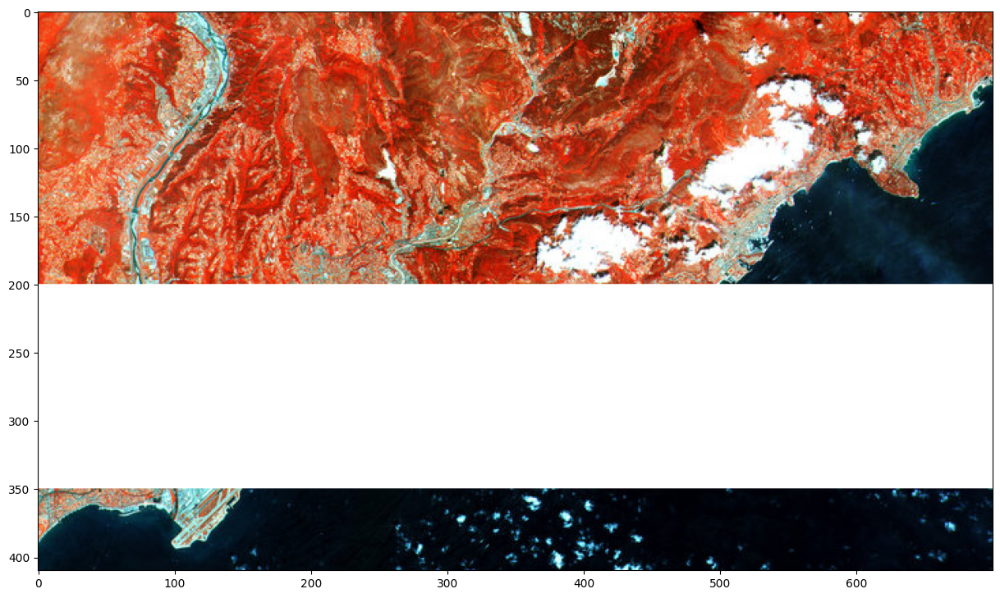

In [30]:
imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")
imageone[200:350, : ] = 255
plt.figure(figsize=(15,15))
plt.imshow(imageone)
plt.show()

Filtering out low pixel values

In [34]:
imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")
print('Shape of data : ',imageone.shape)
low_value = imageone < 50
print('Shape of low value filter',low_value.shape)

Shape of data :  (410, 700, 3)
Shape of low value filter (410, 700, 3)


C:\Users\Hello\AppData\Local\Temp\ipykernel_3284\3782159846.py:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")


Filtering out low values

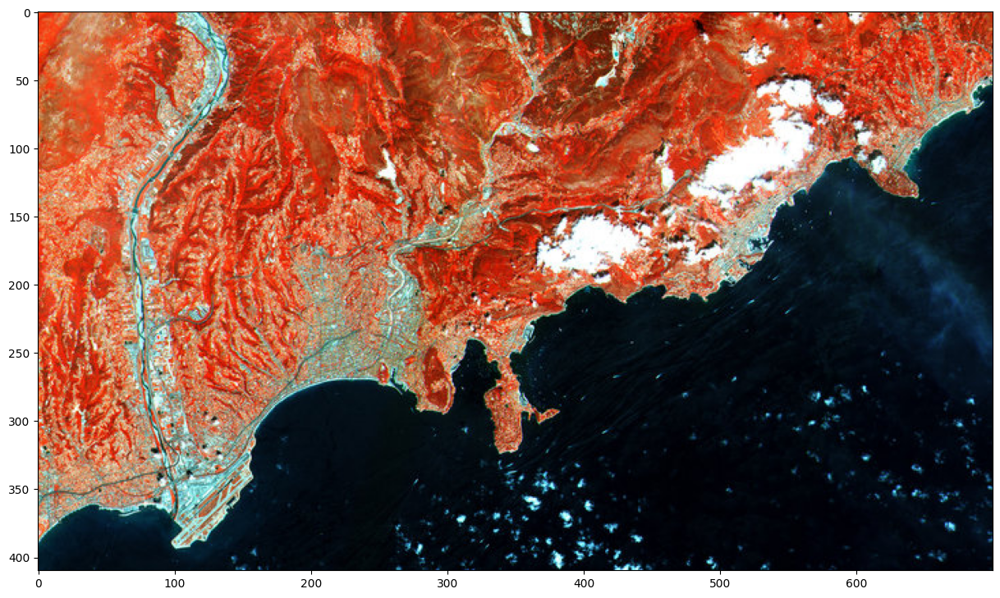

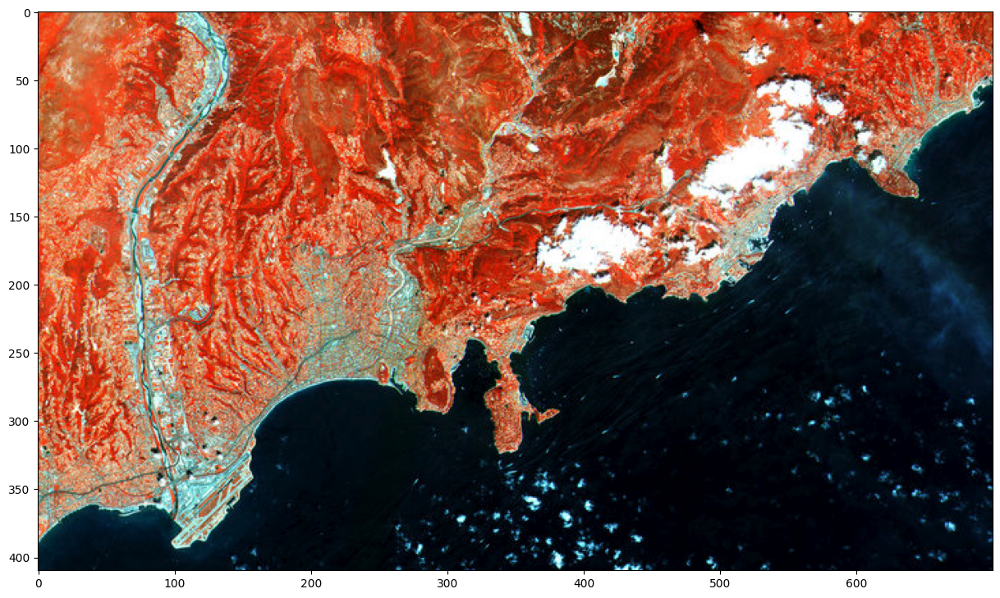

In [35]:
# when ever the low value is true, the value is set to 0
plt.figure(figsize=(15,15))
plt.imshow(imageone)
imageone[low_value] = 0
plt.figure(figsize=(15,15))
plt.imshow(imageone)

More row and column operations

In [36]:
# Trying linear relationships
row_range = np.arange(len(imageone))
col_range = row_range
print(type(row_range))

<class 'numpy.ndarray'>


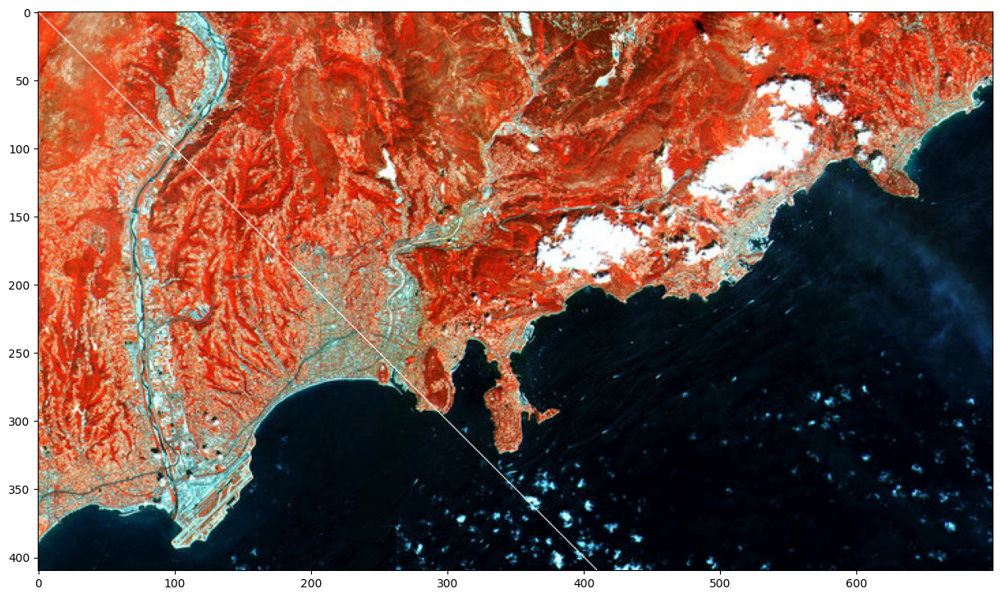

In [39]:
imageone[row_range, col_range,1] = 255
plt.figure(figsize=(15,15))
plt.imshow(imageone)


We see a straight linear line through the image

MASKING IMAGES

In [40]:
total_rows, total_cols, total_layers = imageone.shape
print(total_rows, total_cols, total_layers)

410 700 3


In [41]:
X,Y = np.ogrid[:total_rows, :total_cols]
print(f"X : { X.shape} Y : {Y.shape}" )

X : (410, 1) Y : (1, 700)


In [43]:
center_row, center_col = total_rows/2, total_cols/2
print(f"center_row : {center_row} center_col : {center_col}")

center_row : 205.0 center_col : 350.0


In [44]:
distance_from_center = (X-center_row)**2 + (Y-center_col)**2
print(distance_from_center.shape)

(410, 700)


In [46]:
radius = (total_rows/2)**2
print(radius)

42025.0


In [47]:
circular_mask = (distance_from_center > radius)
print(circular_mask.shape)

(410, 700)


In [49]:
£print(circular_mask)[411:415, 700:715]

[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]


TypeError: 'NoneType' object is not subscriptable

C:\Users\Hello\AppData\Local\Temp\ipykernel_3284\2972123998.py:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")


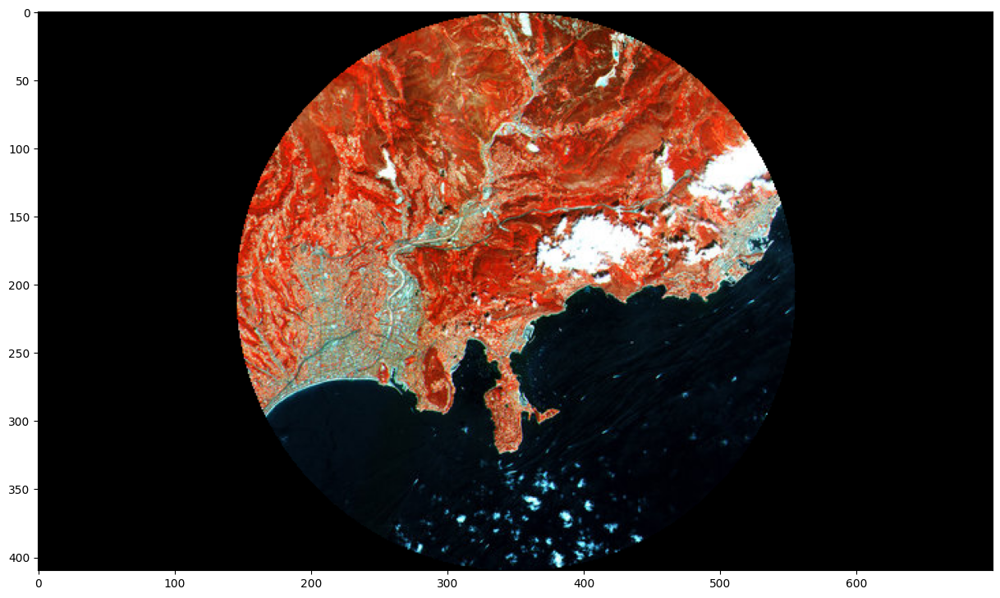

In [50]:
imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")
imageone[circular_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(imageone)


Further Masking

C:\Users\Hello\AppData\Local\Temp\ipykernel_3284\3994741953.py:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")
C:\Users\Hello\AppData\Local\Temp\ipykernel_3284\3994741953.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")


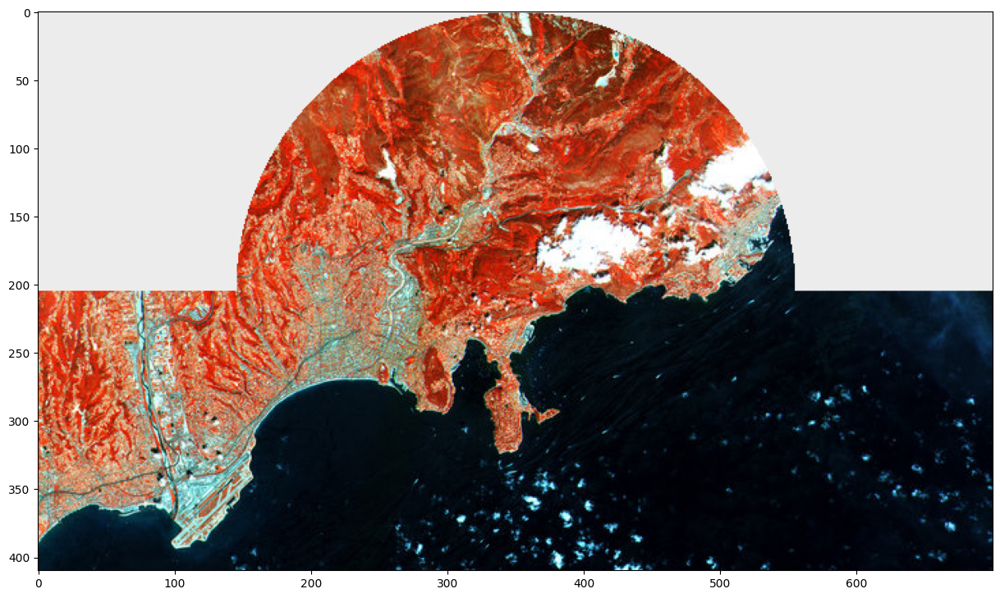

In [53]:
import random
imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")
new_X , new_Y = np.ogrid[:total_rows, :total_cols]
half_upper = new_X < center_row

half_upper_mask = np.logical_and(half_upper, circular_mask)
imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")
imageone[half_upper_mask] = 255
# imageone[half_upper_mask] = random.randint(200,255)
plt.figure(figsize=(15,15))
plt.imshow(imageone)



Processing of different pixels

In [54]:
# Red pixels
imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")
red_mask = imageone[:, :, 0] < 150

C:\Users\Hello\AppData\Local\Temp\ipykernel_3284\2641625974.py:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")


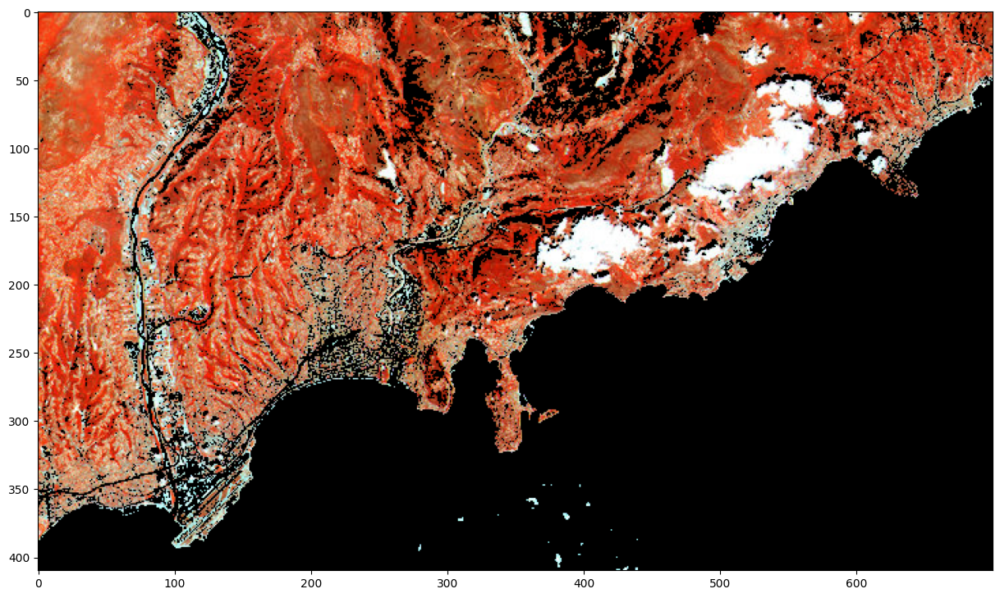

In [55]:
imageone[red_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(imageone)


C:\Users\Hello\AppData\Local\Temp\ipykernel_3284\3877296819.py:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")


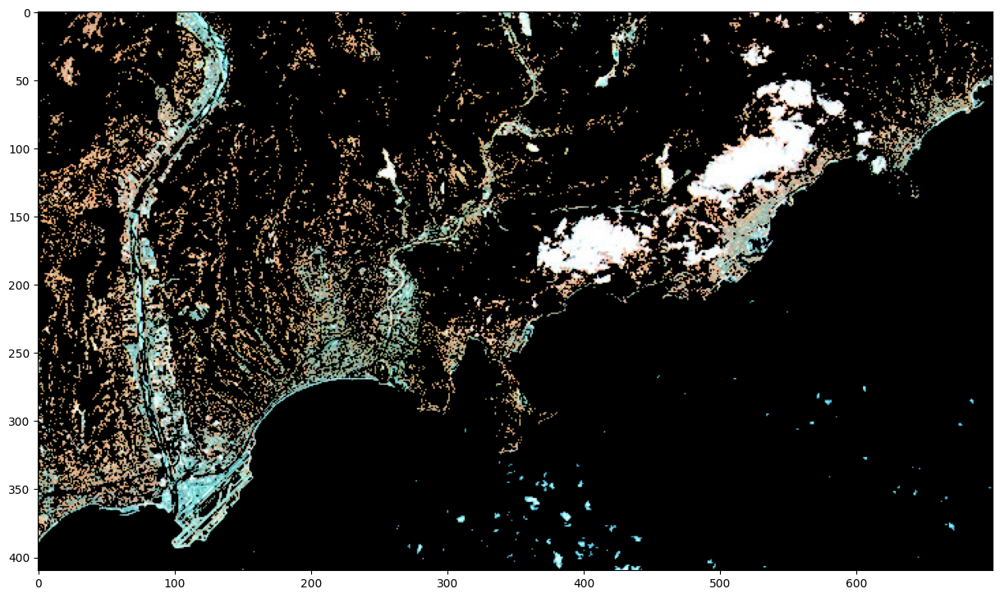

In [56]:
# Green pixels
imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")
green_mask =imageone[:, :, 1] < 150

imageone[green_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(imageone)


C:\Users\Hello\AppData\Local\Temp\ipykernel_3284\2198819025.py:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")


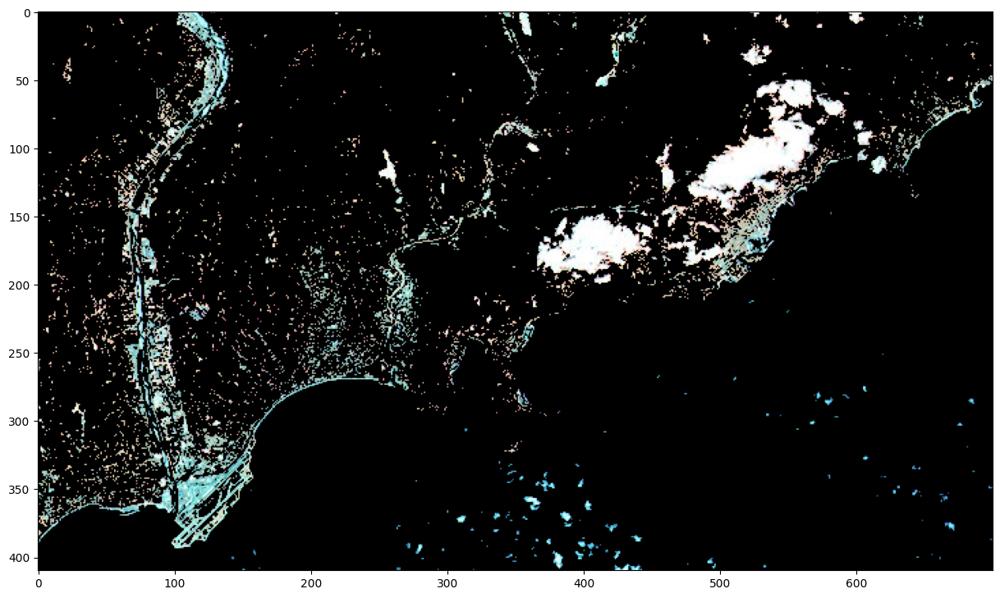

In [57]:
# Blue pixels
imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")
blue_pixels = imageone[:, :, 2] < 150

imageone[blue_pixels] = 0
plt.figure(figsize=(15,15))
plt.imshow(imageone)


Composite masks

C:\Users\Hello\AppData\Local\Temp\ipykernel_3284\2136876502.py:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")


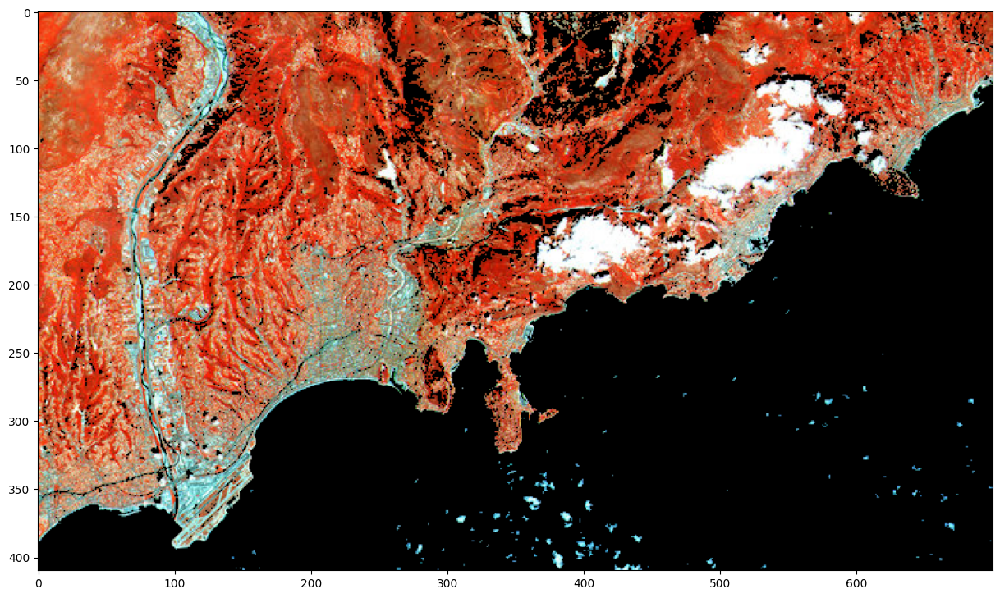

In [58]:
imageone = imageio.imread("French_Riviera_node_full_image_2.jpg")
redMask = imageone[:, :, 0] < 150
greenMask = imageone[:, :, 1] < 100
blueMask = imageone[:, :, 2] < 100

final = np.logical_and(redMask, greenMask, blueMask)
imageone[final] = 0
plt.figure(figsize=(15,15))
plt.imshow(imageone)
